In [1]:
using QuantumToolbox
using PlotlyJS

In [2]:
# function to plot the wigner function
function plot_wigner(rho,xx,yy)
    layout = Layout(
        xaxis_title="Re(β)",
        yaxis_title="Im(β)",
        title="Wigner function",
        width=500,
        height=500
    )
    
    w = wigner(rho, xx, yy);
    vbound = maximum(abs.(w))

    custom_colorscale = [
        [0, "blue"],   # Negative values to blue
        [0.5, "white"],  # Zero values to white
        [1, "red"],     # Positive values to red
    ]

    heatmap_trace = heatmap(
        z=w,
        x=xx,
        y=yy,
        colorscale=custom_colorscale,
        showscale=true,
        zmin = -vbound,
        zmax = vbound
    )

    plot(heatmap_trace, layout)
end;

Here we present a simple procedure to perform the dispersive readout of a qubit, in this case a transmon qubit. The figure of merit is the fidelity, and we will start from scratch using the `QuantumToolbox` library.

# Simplest model: dispersive, RWA, drive frame, and two-level.

The coherent phase $\alpha_{\sigma}$ dependent on the state of the qubit $\sigma = \{-1,1\}$ is given, in the long-time limit after some initial transients, by 

$$ \alpha_{\sigma} = \frac{-\varepsilon_d}{\omega_r - \omega_d + \chi \sigma - i \kappa/2}. $$

Therefore, we expect to see the strongest shift in the phase of the cavity when it is driven at a frequency $\omega_d = \omega_r + \chi \sigma$, which of course depends on the state of the qubit.


In [3]:
# define the parameters
const N_transmon = 2
const N_cavity = 30

const ωr = 3.0 * 2π
const ωq = 2.0 * 2π
const Δ = ωq - ωr

const g = 1
const χ = g^2 / Δ

const κ = 0.2

const εd = 0.15
const δr = -χ # at the maximum coherent phase displacement 
const ωd = ωr - δr; # ωd = ωr + χ


In [38]:

# define the operators
const a = qeye(N_transmon) ⊗ destroy(N_cavity)
const sz = sigmaz() ⊗ qeye(N_cavity)
const sp = sigmap() ⊗ qeye(N_cavity)
const sm = sigmam() ⊗ qeye(N_cavity)
const I = qeye(2) ⊗ qeye(N_cavity);


In [5]:
# define the time-independent Hamiltonians
H_cavity = (ωr * I + χ * sz) * a' * a
H_transmon = ωq * sz / 2 # both of these Hamiltonians are written with the RWA applied on JC term
H = H_cavity + H_transmon + εd * (a + a') - ωd * a' * a;

# time-evolution operator
coef_const(p, t) = 1.0
coef_exp_plus(p, t) = p.εd * exp(1im * p.ωd * t)
coef_exp_minus(p, t) = p.εd * exp(-1im * p.ωd * t)

op = QuantumObjectEvolution(H, coef_const)

# define the collapse operators
c_ops = [sqrt(κ) * a]

# expectation operators -- quadrature
e_ops = [a];

In [6]:
# find the initial state by diagonalizing the transmon Hamiltonian
# H_transmon_only = ωq * create(N_transmon) * destroy(N_transmon)
# values, vectors = eigen(H_transmon_only)
ψ0 = basis(2,0) ⊗ fock(N_cavity, 0);
ψ1 = basis(2,1) ⊗ fock(N_cavity, 0);

In [7]:
# set the time span
tspan = 0.0:0.1:100.0

# run mesolve
result = mesolve(op, ψ0, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan)
result_e = mesolve(op, ψ1, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan);

Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 00s (ETA: 0h 00m 00s)
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 00s (ETA: 0h 00m 00s)


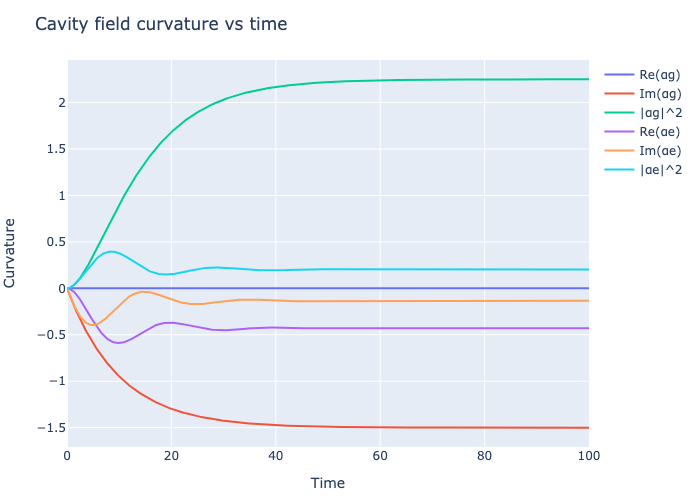

In [8]:
α = result.expect[1,:];
αe = result_e.expect[1,:];

# plot the results
plot_x = scatter(x=tspan, y=real.(α), mode="lines", name="Re(αg)")
plot_p = scatter(x=tspan, y=imag.(α), mode="lines", name="Im(αg)")
plot_abs = scatter(x=tspan, y=abs2.(α), mode="lines", name="|αg|^2")


plot_xe = scatter(x=tspan, y=real.(αe), mode="lines", name="Re(αe)")
plot_pe = scatter(x=tspan, y=imag.(αe), mode="lines", name="Im(αe)")
plot_abse = scatter(x=tspan, y=abs2.(αe), mode="lines", name="|αe|^2")

layout = Layout(title="Cavity field curvature vs time",
                xaxis_title="Time",
                yaxis_title="Curvature",)

plot([plot_x, plot_p, plot_abs, plot_xe, plot_pe, plot_abse], layout)

As expected, when the system is driven at a frequency $\omega_d = \omega_r + \chi $, the phase shift is maximal if the qubit is initialized in the ground state. If it is initialized in the excited state, then the coherent phase will remain nearly null (and more so depending on the strength $\chi$).

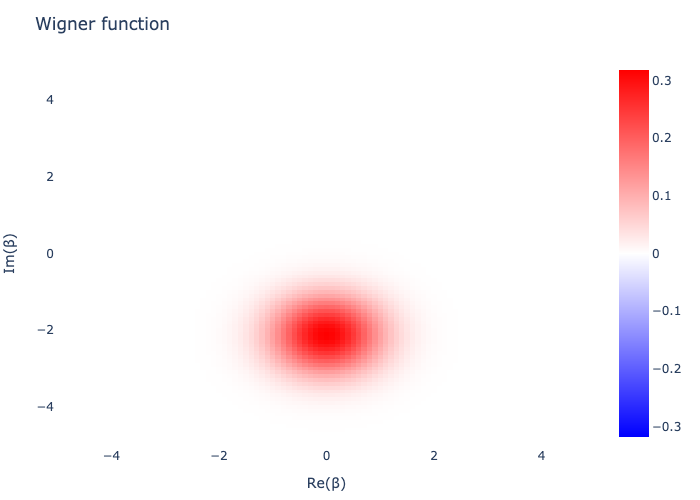

In [28]:
ρ_cavity = ptrace(result.states[end], 2)
plot_wigner(ρ_cavity, -5:0.1:5, -5:0.1:5)

Compute the fidelity between the final steady state obtained numerically and the one we expect theoretically.

In [26]:
α_theory = -εd / (ωr - ωd + χ - im * κ / 2)
ρ_theory = coherent_dm(N_cavity, α_theory)

ρ_cavity = ptrace(result.states[end], 2)

fidelity(ρ_cavity, ρ_theory)

1.0000000428712

Compute the overlap between the state initialized in the ground state and the one initialized in the excited state for their respective maximal phase shifts.

In [10]:
ρg = ptrace(result.states[end], 2)
ρe = ptrace(result_e.states[end], 2)

fidelity(ρg, ρe)

0.3592142491860832

# Go back into lab frame ($H_{disp}$)

In [54]:
# define the time-independent Hamiltonians
H_lab = H_cavity + H_transmon

op_lab = QuantumObjectEvolution((H_lab, (a, coef_exp_plus), (a', coef_exp_minus)));

In [55]:
# set the time span
tspan = 0.0:0.1:100.0

# run mesolve
result_lab = mesolve(op_lab, ψ0, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan)
result_lab_e = mesolve(op_lab, ψ1, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan);

Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 07s (ETA: 0h 00m 00s)
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 05s (ETA: 0h 00m 00s)


The master equation solver takes a lot longer in the lab frame. This is expected, as the quadrature will now be time-dependent even in the steady-state. It is related to the phase in the rotated fame by 
$$ \alpha_{\sigma, \mathrm{lab}} = \alpha_{\sigma} e^{i \omega_d t}. $$
Let's plot it. Importantly, the amplitude does not change.

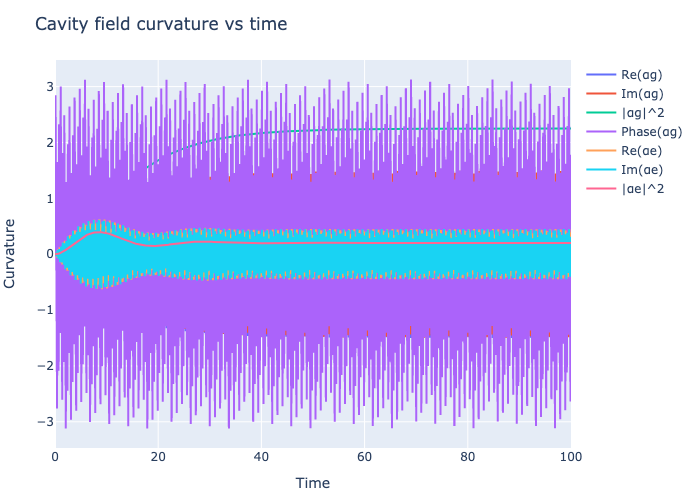

In [57]:
α = result_lab.expect[1,:];
αe = result_lab_e.expect[1,:];

# plot the results
plot_x = scatter(x=tspan, y=real.(α), mode="lines", name="Re(αg)")
plot_p = scatter(x=tspan, y=imag.(α), mode="lines", name="Im(αg)")
plot_abs = scatter(x=tspan, y=abs2.(α), mode="lines", name="|αg|^2")
plot_phase = scatter(x=tspan, y=angle.(α), mode="lines", name="Phase(αg)")

plot_xe = scatter(x=tspan, y=real.(αe), mode="lines", name="Re(αe)")
plot_pe = scatter(x=tspan, y=imag.(αe), mode="lines", name="Im(αe)")
plot_abse = scatter(x=tspan, y=abs2.(αe), mode="lines", name="|αe|^2")

layout = Layout(title="Cavity field curvature vs time",
                xaxis_title="Time",
                yaxis_title="Curvature",)

plot([plot_x, plot_p, plot_abs, plot_phase, plot_xe, plot_pe, plot_abse], layout)

# Undo Bogoliubov

Now go back to the Jaynes-Cummings Hamiltonian in its non-diagonalized form,
$$ H = \omega_r a^\dagger a + \frac{\omega_q}{2} \sigma_z + g (a \sigma_+ + a^\dagger \sigma_-). $$

Now for the drive, I'm not sure how the drive would be undone, or if it is even necessary to undo it.

In [104]:
U_bog = exp(g/Δ * (a' * sm - a * sp))

H_bog = tidyup(U_bog' * H_jc * U_bog)

Quantum Object:   type=Operator   dims=[2, 30]   size=(60, 60)   ishermitian=false
60×60 SparseMatrixCSC{ComplexF64, Int64} with 118 stored entries:
⎡⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎤
⎢⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⎥
⎢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⎥
⎢⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⎥
⎢⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⎥
⎣⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠢⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⎦

In [96]:
# define the time-independent Hamiltonians
H_cavity = ωr * a' * a
H_transmon = ωq * sz / 2 # both of these Hamiltonians are written with the RWA applied on JC term
H_coup = g * (a' * sm + a * sp)
H_jc = H_cavity + H_transmon + H_coup;

op_jc = QuantumObjectEvolution((H_jc, (a, coef_exp_plus), (a', coef_exp_minus))); # add a driving term

Quantum Object Evo.:   type=Operator   dims=[2, 30]   size=(60, 60)   ishermitian=true   isconstant=false
(MatrixOperator(60 × 60) + ScalarOperator(0.0 + 0.0im) * MatrixOperator(60 × 60) + ScalarOperator(0.0 + 0.0im) * MatrixOperator(60 × 60))

In [94]:
# set the time span
tspan = 0.0:0.1:200.0

# run mesolve
result_jc = mesolve(op_jc, ψ0, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan)
result_jc_e = mesolve(op_jc, ψ1, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan);

Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 17s (ETA: 0h 00m 00s)
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 15s (ETA: 0h 00m 00s)


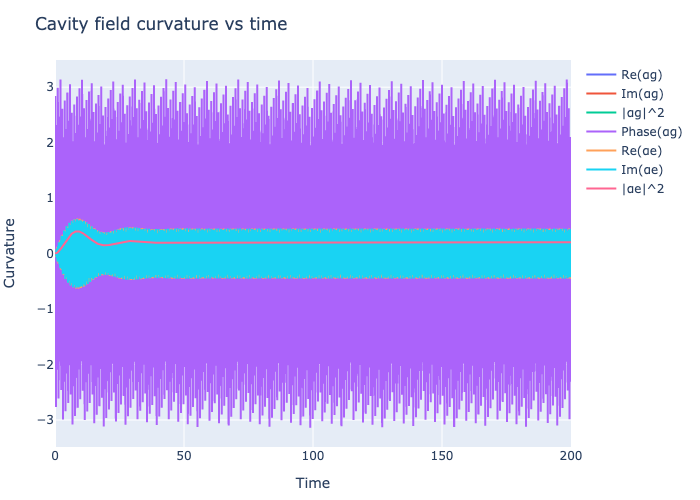

In [95]:
α = result_jc.expect[1,:];
αe = result_jc_e.expect[1,:];

# plot the results
plot_x = scatter(x=tspan, y=real.(α), mode="lines", name="Re(αg)")
plot_p = scatter(x=tspan, y=imag.(α), mode="lines", name="Im(αg)")
plot_abs = scatter(x=tspan, y=abs2.(α), mode="lines", name="|αg|^2")
plot_phase = scatter(x=tspan, y=angle.(α), mode="lines", name="Phase(αg)")

plot_xe = scatter(x=tspan, y=real.(αe), mode="lines", name="Re(αe)")
plot_pe = scatter(x=tspan, y=imag.(αe), mode="lines", name="Im(αe)")
plot_abse = scatter(x=tspan, y=abs2.(αe), mode="lines", name="|αe|^2")

layout = Layout(title="Cavity field curvature vs time",
                xaxis_title="Time",
                yaxis_title="Curvature",)

plot([plot_x, plot_p, plot_abs, plot_phase, plot_xe, plot_pe, plot_abse], layout)

# Undo RWA

This is now the most general system. We do not apply any approximations on either the drive nor the coupling. The Hamiltonian is
$$ H = \omega_r a^\dagger a + \frac{\omega_q}{2} \sigma_z - g (a^{\dagger} - a)(\sigma_+ - \sigma_-) + \varepsilon_d (a + a^\dagger) \cos(\omega_d t). $$

In [44]:
# define the time-independent Hamiltonians
H_coup_total = - g * (a' - a) * (sp - sm)
H_total = H_cavity + H_transmon + H_coup_total;

coef_cos(p, t) = p.εd * cos(p.ωd * t)

op_total = QuantumObjectEvolution((H_total, (a' + a, coef_cos))); # add a driving term

Quantum Object Evo.:   type=Operator   dims=[2, 30]   size=(60, 60)   ishermitian=true   isconstant=false
(MatrixOperator(60 × 60) + ScalarOperator(0.0 + 0.0im) * MatrixOperator(60 × 60))

In [108]:
# set the time span
tspan = 0.0:0.1:200.0

# run mesolve
result_total = mesolve(op_total, ψ0, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan)
result_total_e = mesolve(op_total, ψ1, tspan, c_ops, e_ops=e_ops, params=(εd=εd, ωd=ωd), saveat=tspan);

Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 13s (ETA: 0h 00m 00s)
Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 13s (ETA: 0h 00m 00s)


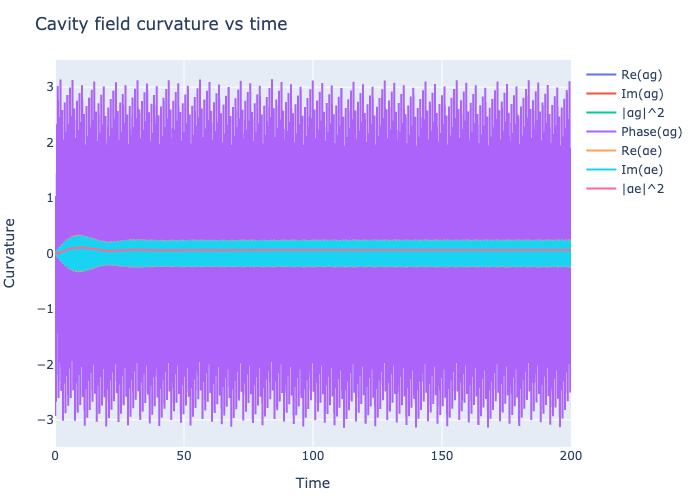

In [109]:
α = result_total.expect[1,:];
αe = result_total_e.expect[1,:];

# plot the results
plot_x = scatter(x=tspan, y=real.(α), mode="lines", name="Re(αg)")
plot_p = scatter(x=tspan, y=imag.(α), mode="lines", name="Im(αg)")
plot_abs = scatter(x=tspan, y=abs2.(α), mode="lines", name="|αg|^2")
plot_phase = scatter(x=tspan, y=angle.(α), mode="lines", name="Phase(αg)")

plot_xe = scatter(x=tspan, y=real.(αe), mode="lines", name="Re(αe)")
plot_pe = scatter(x=tspan, y=imag.(αe), mode="lines", name="Im(αe)")
plot_abse = scatter(x=tspan, y=abs2.(αe), mode="lines", name="|αe|^2")

layout = Layout(title="Cavity field curvature vs time",
                xaxis_title="Time",
                yaxis_title="Curvature",)

plot([plot_x, plot_p, plot_abs, plot_phase, plot_xe, plot_pe, plot_abse], layout)

There are more timescales in the full case, as expected.

Little snippet to animate the Wigner function via a post-processed .gif file.

In [26]:
ρs = result.states
wigners = []
xx = -5:0.1:5
for ρ in ρs
    push!(wigners, wigner(ρ, xx, xx))
end

┌ Info: Saved animation to /Users/leo/Desktop/PhD research/Code and notebooks/simple_phd_codes/plots/wigner.gif
└ @ Plots /Users/leo/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/Users/leo/Desktop/PhD research/Code and notebooks/simple_phd_codes/plots/wigner.gif")
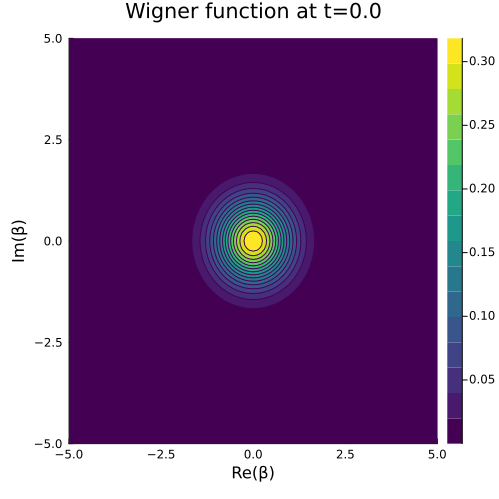

In [ ]:
using Plots

# Define the parameters and states
N = length(tspan)

output_folder = "~/Desktop/PhD research/Code and notebooks/simple_phd_codes/plots/"
output_file = joinpath(output_folder, "wigner.gif")

# Create the GIF
anim = @animate for i in 1:N
    t = tspan[i]
    Plots.contourf(xx, xx, wigners[i], c=:viridis, title="Wigner function at t=$t", xlabel="Re(β)", ylabel="Im(β)", size=(500, 500))
end
gif(anim, output_file, fps=24);  # Adjust the frame rate as needed